In [4]:
import ee
import geemap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

ee.Authenticate()

ee.Initialize(project='general-porpose')

geometry = ee.Geometry.Polygon(
    [[[-56.19933935093308, -15.570030087161426],
      [-56.236418208354955, -15.63616420965171],
      [-56.173246821636205, -15.75515175246836],
      [-56.110075434917455, -15.760438474073672],
      [-56.079863032573705, -15.701615952093842],
      [-56.002958735698705, -15.706243058621192],
      [-55.91712804722214, -15.675173328966476],
      [-55.92468114780808, -15.622277812891932],
      [-55.98510595249558, -15.587888400489534],
      [-56.00982519077683, -15.527031492578372],
      [-56.052397212261205, -15.503213026342152],
      [-56.09290929722214, -15.518430696875168],
      [-56.13616796421433, -15.537616594867629]]])


In [7]:
indice_desejado = 'NDVI'  # Escolha entre 'EVI', 'NDVI', 'NDBI' ou 'UI'


def calcular_indice(imagem, sensor, indice):
    nir = imagem.select(get_band(bandas, 'NIR', sensor))
    red = imagem.select(get_band(bandas, 'RED', sensor))
    blue = imagem.select(get_band(bandas, 'BLUE', sensor))
    swir = imagem.select(get_band(bandas, 'SWIR', sensor))

    if indice == 'EVI':
        return imagem.expression(
            '2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))',
            {'NIR': nir, 'RED': red, 'BLUE': blue}
        ).rename('EVI')

    elif indice == 'NDVI':
        return imagem.normalizedDifference([get_band(bandas, 'NIR', sensor),
                                            get_band(bandas, 'RED', sensor)]).rename('NDVI')

    elif indice == 'NDBI':
        return imagem.normalizedDifference([get_band(bandas, 'SWIR', sensor),
                                            get_band(bandas, 'NIR', sensor)]).rename('NDBI')

    elif indice == 'UI':
        ndvi = imagem.normalizedDifference([get_band(bandas, 'NIR', sensor),
                                            get_band(bandas, 'RED', sensor)])
        ndbi = imagem.normalizedDifference([get_band(bandas, 'SWIR', sensor),
                                            get_band(bandas, 'NIR', sensor)])
        return ndbi.subtract(ndvi).rename('UI')

    else:
        raise ValueError(f"Índice desconhecido: {indice}")


def mask_clouds(image):
    qa = image.select('QA_PIXEL')
    cloud_bit = 1 << 3
    shadow_bit = 1 << 4
    mask = qa.bitwiseAnd(cloud_bit).eq(0).And(qa.bitwiseAnd(shadow_bit).eq(0))
    return image.updateMask(mask)

bandas = {
        'LANDSAT_8':  {'NIR': 'SR_B5', 'RED': 'SR_B4', 'BLUE': 'SR_B2', 'SWIR': 'SR_B6'},
        'LANDSAT_9':  {'NIR': 'SR_B5', 'RED': 'SR_B4', 'BLUE': 'SR_B2', 'SWIR': 'SR_B6'},
        'default':  {'NIR': 'SR_B5', 'RED': 'SR_B4', 'BLUE': 'SR_B2', 'SWIR': 'SR_B6'},

    }

def get_band(bands_dict, band_name,sensor):
    return bands_dict.get(sensor, bands_dict['default'])[band_name]


colecao_merged = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2") \
    .merge(ee.ImageCollection("LANDSAT/LC09/C02/T1_L2"))

imagens_processadas = []

for ano in range(2013, 2025):
    for mes in range(7, 8):
        try:
            inicio = f"{ano}-{mes:02d}-01"
            fim = f"{ano}-{mes:02d}-28"

            colecao = colecao_merged \
                .filterBounds(geometry) \
                .filterDate(inicio, fim) \
                .filter(ee.Filter.lt('CLOUD_COVER', 30)) \
                .map(mask_clouds)

            imagem = colecao.sort('CLOUD_COVER').first()

            if imagem is None or imagem.getInfo() is None:
                continue

            sensor = ee.String(imagem.get('SPACECRAFT_ID')).getInfo()
            nir = imagem.select(get_band(bandas, 'NIR', sensor))
            red = imagem.select(get_band(bandas, 'RED', sensor))
            blue = imagem.select(get_band(bandas, 'BLUE', sensor))

            indice = calcular_indice(imagem, sensor, indice_desejado)
            imagem = imagem.addBands(indice)
            indice_array = geemap.ee_to_numpy(indice, region=geometry, scale=15)

            imagens_processadas.append({
                'ano': ano,
                'mes': mes,
                'data': imagem.date().format("YYYY-MM-dd").getInfo(),
                'image_id': imagem.get('system:id').getInfo(),
                'cloud_percent': imagem.get('CLOUD_COVER').getInfo(),
                f'{indice_desejado.lower()}_array': indice_array,
                'imagem_raw': imagem
            })

            print(f"Extraído {indice_desejado} para {ano}-{mes:02d}")

        except Exception as e:
            print(f"Erro Landsat {ano}-{mes:02d}: {e}")


Extraído NDVI para 2013-07
Extraído NDVI para 2014-07
Extraído NDVI para 2016-07
Extraído NDVI para 2017-07
Extraído NDVI para 2018-07
Extraído NDVI para 2019-07
Extraído NDVI para 2020-07
Extraído NDVI para 2021-07
Extraído NDVI para 2022-07
Extraído NDVI para 2023-07
Extraído NDVI para 2024-07


In [ ]:
def limiar_adaptativo_com_crescimento(imagens_evi, threshold_inicial=0.5):
    resultados = []
    mascara_anterior = None
    threshold_anterior = threshold_inicial
    media_anterior = None

    for i, dado in enumerate(imagens_evi):
        evi = np.squeeze(dado['evi_array'])
        mascara = np.zeros_like(evi, dtype=bool)

        if i == 0:
            mascara = evi < threshold_inicial
            media_anterior = np.nanmean(evi[mascara])
            threshold_atual = threshold_inicial
        else:
            valores_anteriores = evi[mascara_anterior]
            media_atual = np.nanmean(valores_anteriores)

            if media_atual is not None and media_anterior is not None and media_anterior > 0:
                # threshold_atual = threshold_anterior * (media_atual / media_anterior)
                threshold_atual = threshold_anterior
            else:
                threshold_atual = threshold_anterior

            mascara = evi < threshold_atual
            mascara = np.logical_or(mascara, mascara_anterior)
            media_anterior = np.nanmean(evi[mascara])

        resultados.append({
            'data': dado['data'],
            'evi_array': evi,
            'threshold': threshold_atual,
            'mascara': mascara,
            'image_id': dado['image_id'],
            'cloud_percent': dado['cloud_percent'],
            'ano': dado['ano'],
            'mes': dado['mes'],
            'imagem_raw': dado['imagem_raw']
        })

        mascara_anterior = mascara.copy()
        threshold_anterior = threshold_atual

    return resultados


resultado_adaptativo = limiar_adaptativo_com_crescimento(imagens_evi, threshold_inicial=0.5)

df_resultado = pd.DataFrame([
    {
        'ano': r['ano'],
        'mes': r['mes'],
        'data': r['data'],
        'threshold': r['threshold'],
        'proporcao_ativos': np.count_nonzero(r['mascara']) / np.size(r['mascara']),
        'cloud_percent': r['cloud_percent'],
        'image_id': r['image_id'],
    }
    for r in resultado_adaptativo
])

df_resultado.to_csv("landsat_evi_adaptativo.csv", index=False)
print("CSV salvo com resultados adaptativos.")


CSV salvo com resultados adaptativos.


In [13]:
def limiar_adaptativo_por_pixels_fixos(imagens, threshold_inicial=0.7):
    """
    imagens: lista de dicionários com arrays de EVI e metadados ordenados no tempo
    threshold_inicial: valor de corte da primeira imagem

    Retorna lista com:
    - threshold usado
    - proporção de pixels ativos
    - máscara de pixels ativos
    """
    resultados = []
    threshold_anterior = threshold_inicial
    mascara_referencia = None
    media_anterior = None

    for i, dado in enumerate(imagens):
        indice = np.squeeze(dado[f'{indice_desejado.lower()}_array'])

        if i == 0:
            # Primeira imagem: define threshold inicial e pixels de referência
            mascara_referencia = indice > threshold_inicial
            media_anterior = np.nanmean(indice[mascara_referencia])
            threshold_atual = threshold_inicial
            mascara_atual = indice < threshold_inicial
        else:
            # Usa os mesmos pixels da imagem anterior
            valores_referencia = indice[mascara_referencia]
            media_atual = np.nanmean(valores_referencia)

            if media_anterior is not None and media_anterior > 0 and media_atual is not None:
                print("entrou aqui")
                threshold_atual = threshold_inicial * (media_atual / media_anterior)
                threshold_atual = threshold_inicial 
            else:
                print(media_anterior,media_atual)
                threshold_atual = threshold_anterior  # fallback

            # Atualiza máscara para a imagem atual com base no novo threshold
            mascara_atual = indice < threshold_atual
            # media_anterior = np.nanmean(evi)

        resultados.append({
            'data': dado['data'],
            'indice_array': indice,
            'threshold': threshold_atual,
            'mascara': mascara_atual.copy(),
            'image_id': dado['image_id'],
            'cloud_percent': dado['cloud_percent'],
            'ano': dado['ano'],
            'mes': dado['mes'],
            'imagem_raw': dado['imagem_raw']
        })

        threshold_anterior = threshold_atual

    return resultados


resultado_adaptativo = limiar_adaptativo_por_pixels_fixos(imagens_processadas, threshold_inicial=-0.1)

df_resultado = pd.DataFrame([
    {
        'ano': r['ano'],
        'mes': r['mes'],
        'data': r['data'],
        'threshold': r['threshold'],
        'proporcao_ativos': np.count_nonzero(r['mascara']) / np.size(r['mascara']),
        'cloud_percent': r['cloud_percent'],
        'image_id': r['image_id']
    }
    for r in resultado_adaptativo
])

df_resultado.to_csv("landsat_evi_adaptativo.csv", index=False)
print("CSV salvo com resultados adaptativos.")



-0.025803793 -0.062673725
-0.025803793 -0.029764676
-0.025803793 -0.051751617
-0.025803793 -0.04488175
-0.025803793 -0.06339167
-0.025803793 -0.038596522
-0.025803793 -0.035196874
-0.025803793 -0.06984822
-0.025803793 -0.051649045
-0.025803793 -0.061763678
CSV salvo com resultados adaptativos.


In [4]:
def plotar_mascaras(resultados, ncols=4):
    n = len(resultados)
    nrows = (n + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    axes = axes.flatten()

    for i, r in enumerate(resultados):
        ax = axes[i]
        mascara = r['mascara']
        ax.imshow(mascara, cmap=ListedColormap(['white', 'black']))
        ax.set_title(f"{r['data']}\nThreshold={r['threshold']:.2f}")
        ax.axis('off')

    # Remove eixos extras
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

def plotar_proporcao_temporal(resultados):
    datas = [r['data'] for r in resultados]
    proporcoes = [np.count_nonzero(r['mascara']) / np.size(r['mascara']) for r in resultados]

    plt.figure(figsize=(10, 5))
    plt.plot(datas, proporcoes, marker='o')
    plt.xticks(rotation=45)
    plt.ylabel("Proporção de pixels ativos")
    plt.title("Evolução temporal da área ativa (máscara EVI)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


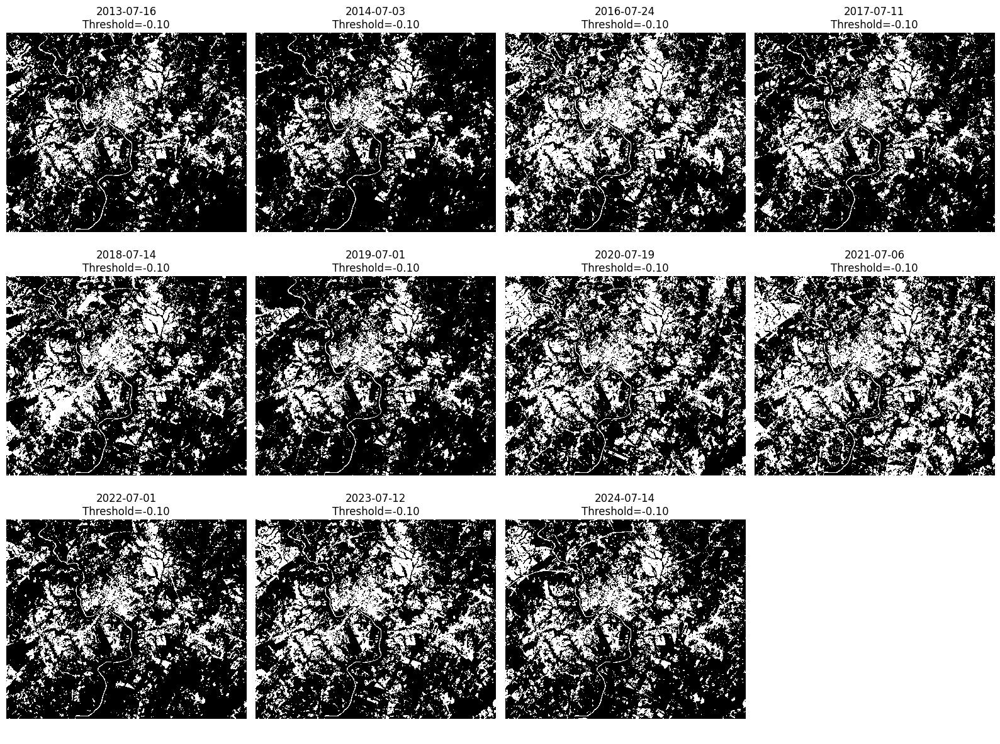

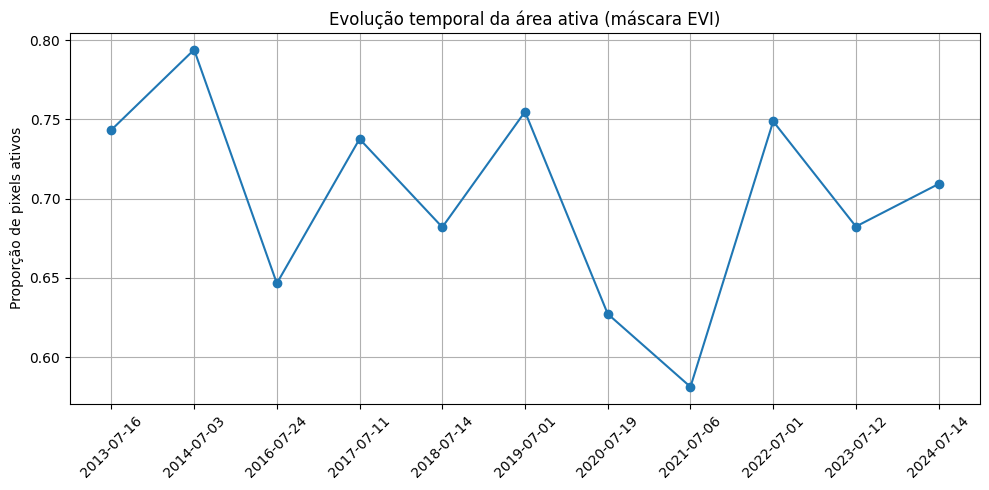

In [14]:
plotar_mascaras(resultado_adaptativo)
plotar_proporcao_temporal(resultado_adaptativo)

In [201]:
bandas_sentinel2 = ['B2', 'B4', 'B8']
bandas_rgb =['SR_B4', 'SR_B3', 'SR_B2']
def plotar_rgb(resultados,bands , scale=3000, ncols=3):
    """
    Exibe apenas as imagens RGB das imagens armazenadas em 'resultados'.
    """
    n = len(resultados)
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
    axes = axes.flatten()

    for i, r in enumerate(resultados):
        ax = axes[i]
        try:
            imagem = r['imagem_raw']
            rgb = geemap.ee_to_numpy(imagem.select(bands), region=geometry, scale=15)

            print(f"[{r['data']}] shape: {rgb.shape}")

            if rgb.shape[-1] != 3:
                raise ValueError(f"Esperado 3 bandas, mas recebi shape {rgb.shape}")

            rgb = np.clip(rgb / scale, 0,1)

            # Verificação de conteúdo
            if np.isnan(rgb).all():
                ax.text(0.5, 0.5, "Imagem vazia", ha='center', va='center')
            else:
                print(f"min: {rgb.min():.2f}, max: {rgb.max():.2f}")
                ax.imshow(rgb)

            ax.set_title(f"RGB {r['data']}")
            ax.axis('off')

        except Exception as e:
            print(f"Erro ao processar imagem {i}: {e}")
            ax.text(0.5, 0.5, "Erro", ha='center', va='center')
            ax.axis('off')

    # Apaga eixos extras (caso n < nrows*ncols)
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()




In [207]:
imagems =  resultado_adaptativo[0]['imagem_raw']
rgb = geemap.ee_to_numpy(imagems.select(bandas_sentinel2), region=geometry, scale=20)
rgb = np.clip(rgb, 0, 1)  # faixa típica Landsat

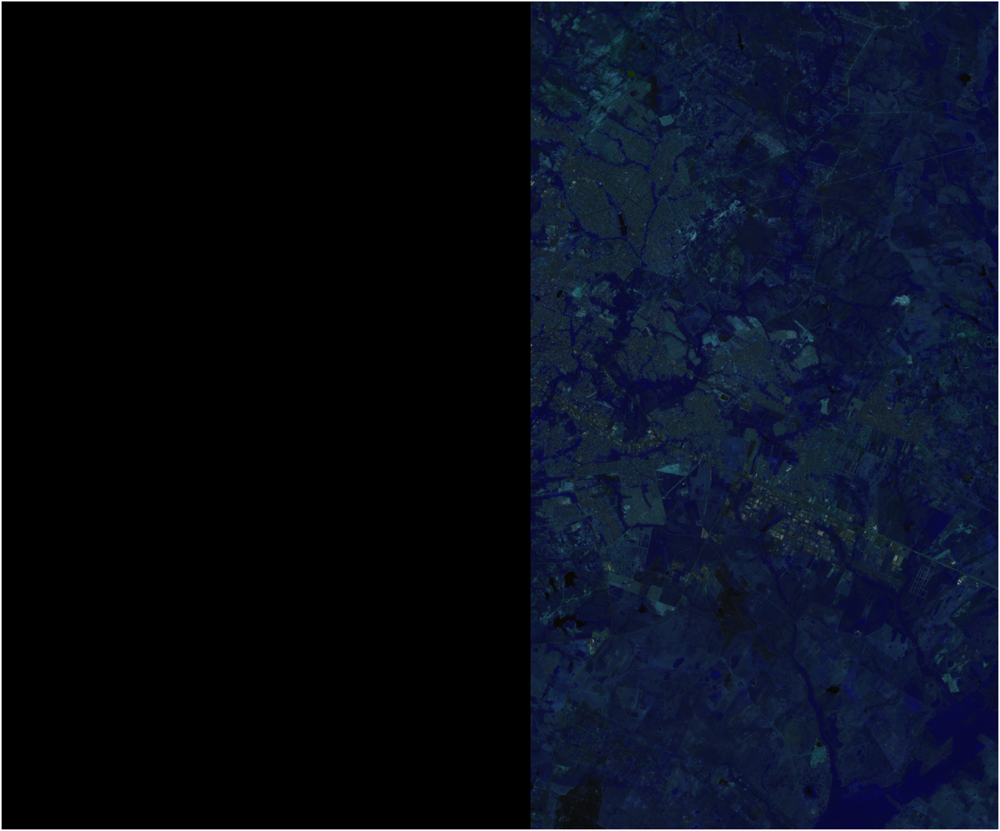

In [208]:
plt.figure(figsize=(80, 80))
plt.imshow(rgb)
# plt.title(f'Imagem RGB - {sensor}')
plt.axis('off')
plt.show()


In [186]:
imagems =  resultado_adaptativo[2]['imagem_raw']
rgb = geemap.ee_to_numpy(imagems.select(['SR_B4', 'SR_B3', 'SR_B2']), region=geometry, scale=15)
rgb = np.clip(rgb / 30000, 0, 1)  # faixa típica Landsat

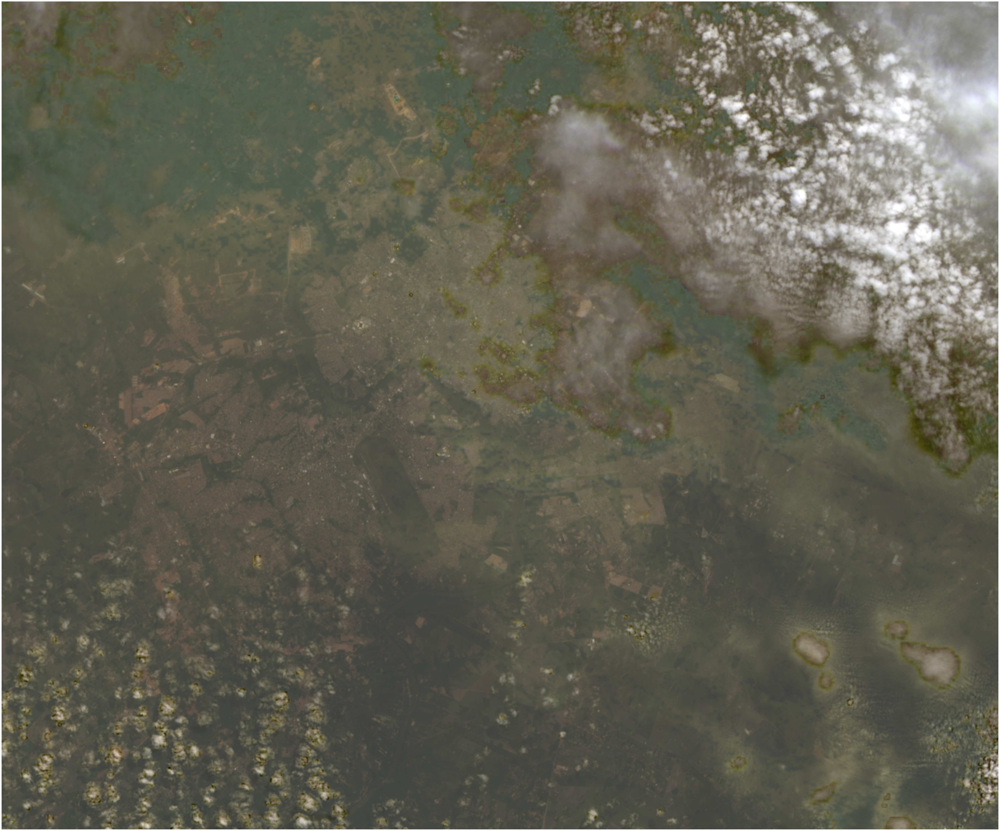

In [187]:
plt.figure(figsize=(80, 80))
plt.imshow(rgb)
# plt.title(f'Imagem RGB - {sensor}')
plt.axis('off')
plt.show()


In [63]:
imagens_raw